# Employee Promotion by using Machine Learning

# Package Importing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

# Datasets Reading

In [3]:
Data = pd.read_csv("Dataset.csv")
Data

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0


,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0


# Datasets Pre-Processing

In [4]:
Data.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [5]:
Data.tail()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0
54807,51526,HR,region_22,Bachelor's,m,other,1,27,1.0,5,0,0,49,0


,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0
54807,51526,HR,region_22,Bachelor's,m,other,1,27,1.0,5,0,0,49,0


In [6]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB
<class 'panda

In [7]:
Data.describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


In [8]:
Data.shape

(54808, 14)

(54808, 14)

In [9]:
Data.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

In [10]:
Data = Data.drop('KPIs_met >80%',axis=1)

In [11]:
Data = Data.drop('awards_won?',axis=1)

In [12]:
Data

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,45,0


,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,45,0


In [13]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
Data['department']= label_encoder.fit_transform(Data['department'])
Data['region']= label_encoder.fit_transform(Data['region'])
Data['education']= label_encoder.fit_transform(Data['education'])
Data['gender']= label_encoder.fit_transform(Data['gender'])
Data['gender']= label_encoder.fit_transform(Data['gender'])
Data['recruitment_channel']= label_encoder.fit_transform(Data['recruitment_channel'])

In [14]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  int32  
 2   region                54808 non-null  int32  
 3   education             54808 non-null  int32  
 4   gender                54808 non-null  int64  
 5   recruitment_channel   54808 non-null  int32  
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  avg_training_score    54808 non-null  int64  
 11  is_promoted           54808 non-null  int64  
dtypes: float64(1), int32(4), int64(7)
memory usage: 4.2 MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 12 columns):
 #   Col

In [15]:
Data = Data.dropna()

In [16]:
Data.isna().sum()

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
avg_training_score      0
is_promoted             0
dtype: int64

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
avg_training_score      0
is_promoted             0
dtype: int64

# Data Visualization : Explorartory Data Analysis

In [17]:
Data.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'avg_training_score', 'is_promoted'],
      dtype='object')

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'avg_training_score', 'is_promoted'],
      dtype='object')

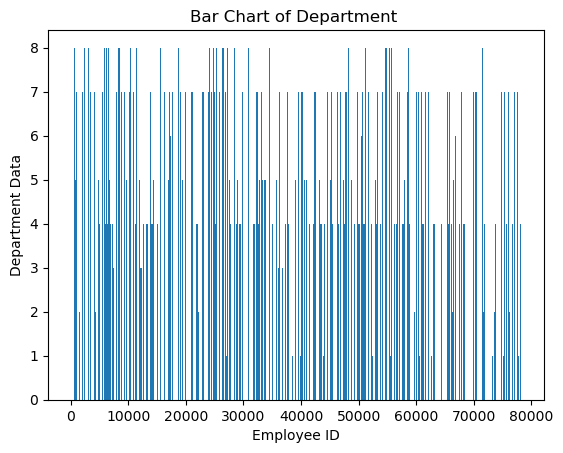

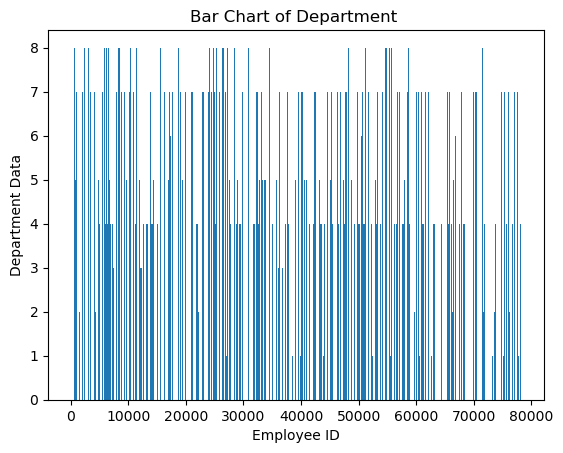

In [18]:
plt.bar(Data['employee_id'],Data['department']) 
plt.title("Bar Chart of Department ") 
plt.xlabel('Employee ID')
plt.ylabel('Department Data')
plt.show()

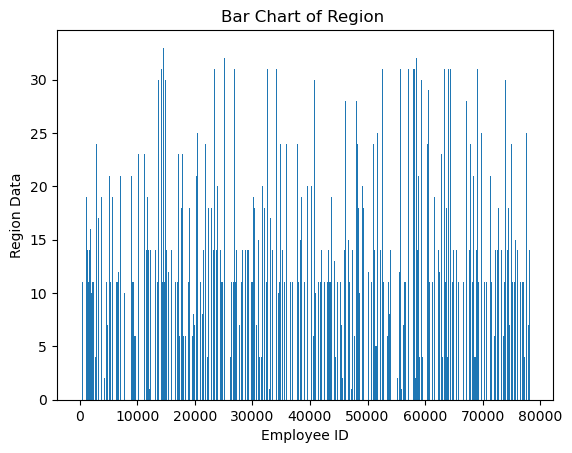

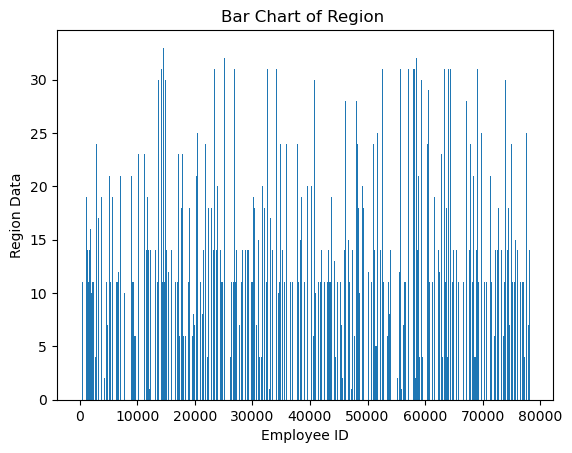

In [19]:
plt.bar(Data['employee_id'],Data['region']) 
plt.title("Bar Chart of Region ") 
plt.xlabel('Employee ID')
plt.ylabel('Region Data')
plt.show()

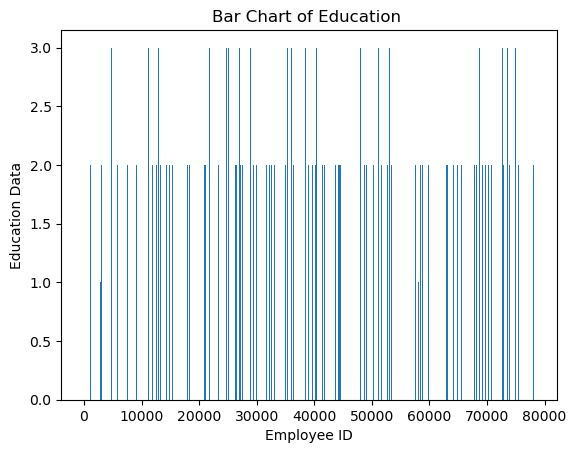

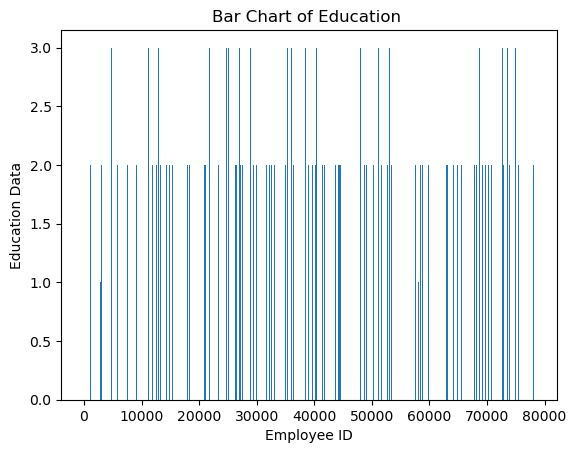

In [20]:
plt.bar(Data['employee_id'],Data['education']) 
plt.title("Bar Chart of Education ") 
plt.xlabel('Employee ID')
plt.ylabel('Education Data')
plt.show()

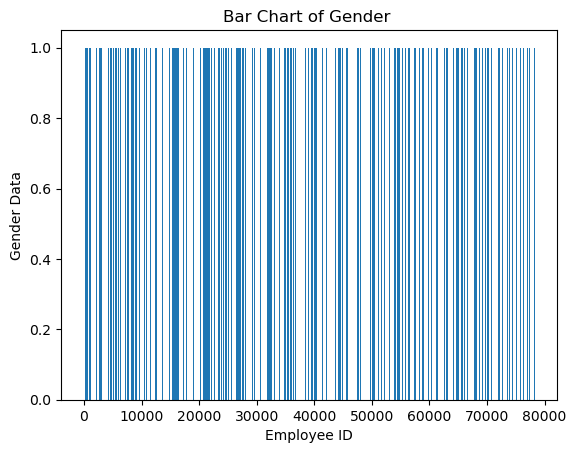

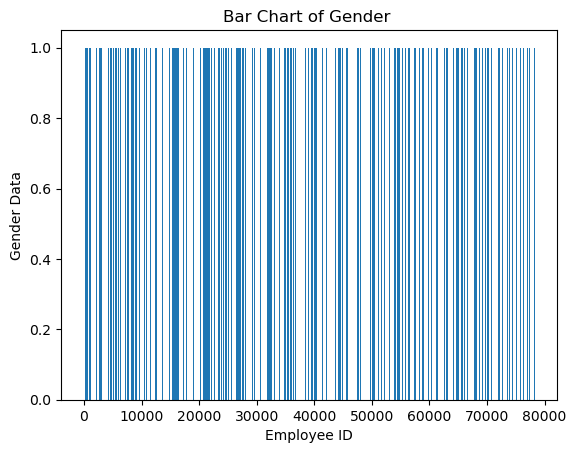

In [21]:
plt.bar(Data['employee_id'],Data['gender']) 
plt.title("Bar Chart of Gender ") 
plt.xlabel('Employee ID')
plt.ylabel('Gender Data')
plt.show()

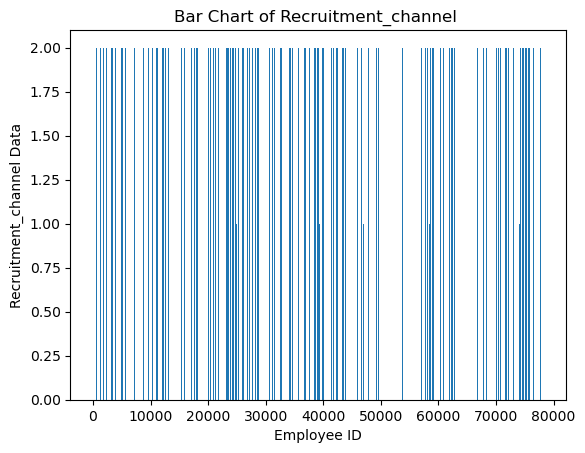

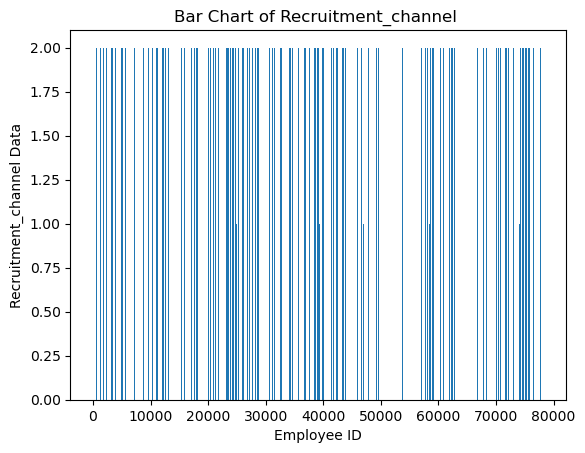

In [22]:
plt.bar(Data['employee_id'],Data['recruitment_channel']) 
plt.title("Bar Chart of Recruitment_channel ") 
plt.xlabel('Employee ID')
plt.ylabel('Recruitment_channel Data')
plt.show()

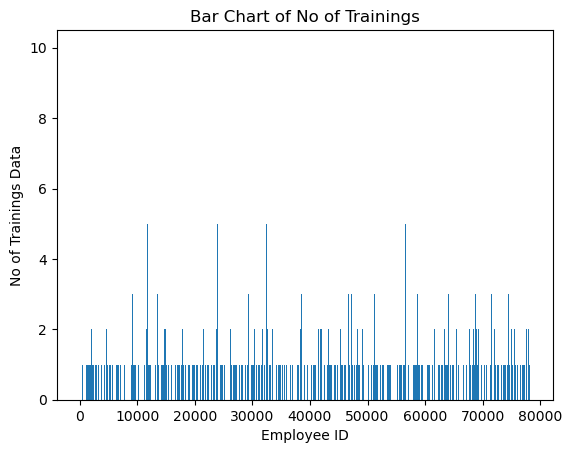

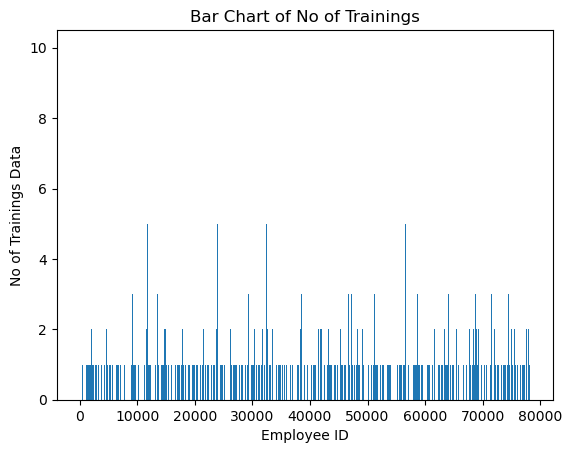

In [23]:
plt.bar(Data['employee_id'],Data['no_of_trainings']) 
plt.title("Bar Chart of No of Trainings") 
plt.xlabel('Employee ID')
plt.ylabel('No of Trainings Data')
plt.show()

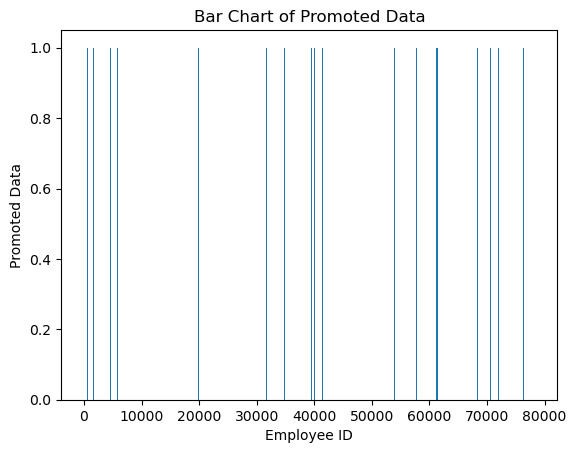

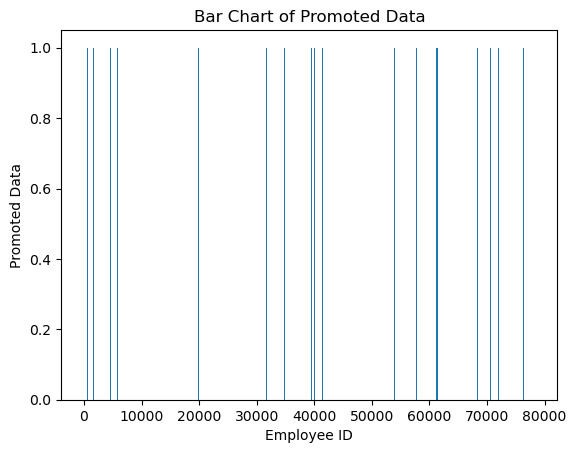

In [24]:
plt.bar(Data['employee_id'],Data['is_promoted']) 
plt.title("Bar Chart of Promoted Data") 
plt.xlabel('Employee ID')
plt.ylabel('Promoted Data')
plt.show()

<AxesSubplot: xlabel='employee_id', ylabel='Density'>

<AxesSubplot: xlabel='employee_id', ylabel='Density'>

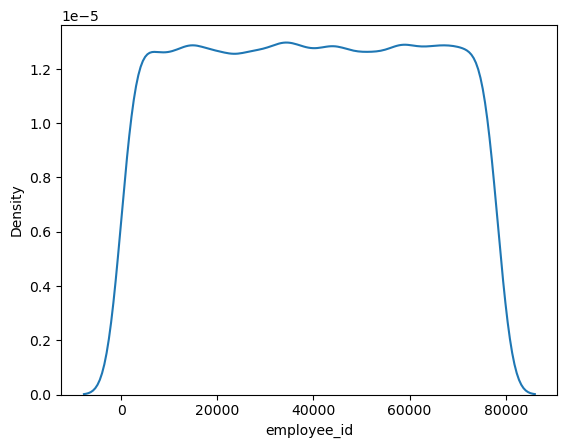

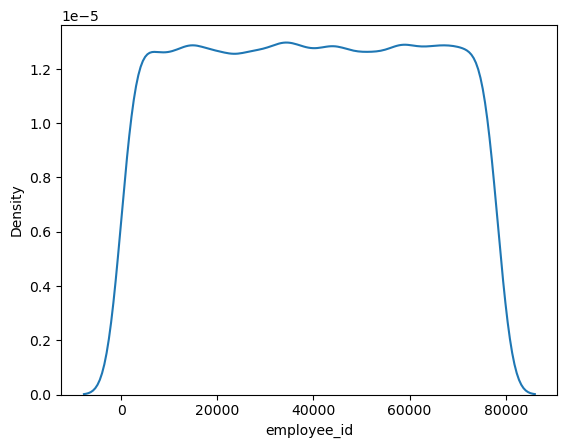

In [25]:
sns.kdeplot(Data['employee_id'])

<AxesSubplot: xlabel='department', ylabel='Density'>

<AxesSubplot: xlabel='department', ylabel='Density'>

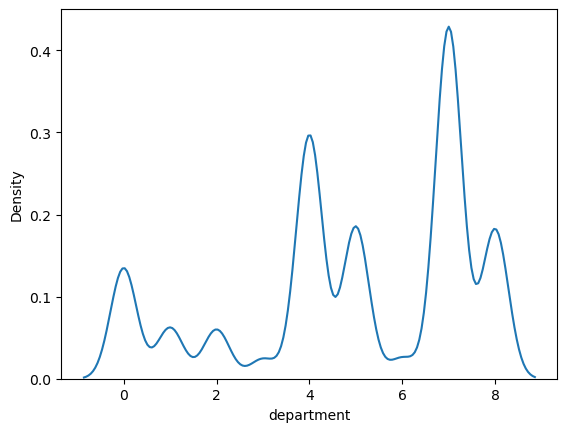

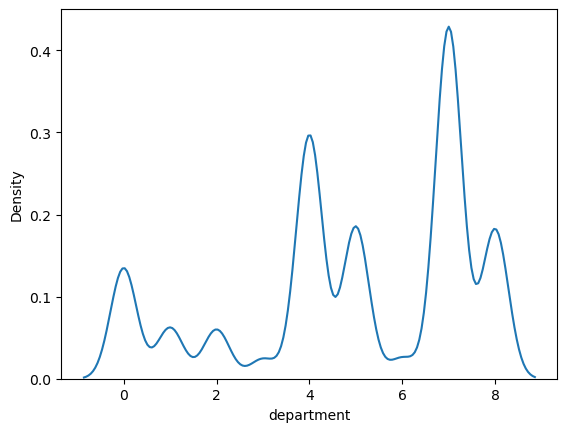

In [26]:
sns.kdeplot(Data['department'])

<AxesSubplot: xlabel='region', ylabel='Density'>

<AxesSubplot: xlabel='region', ylabel='Density'>

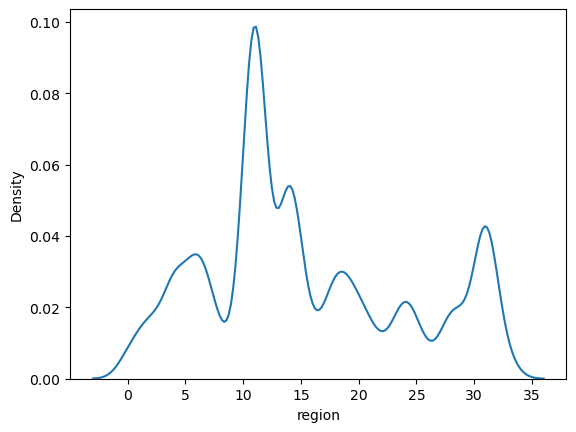

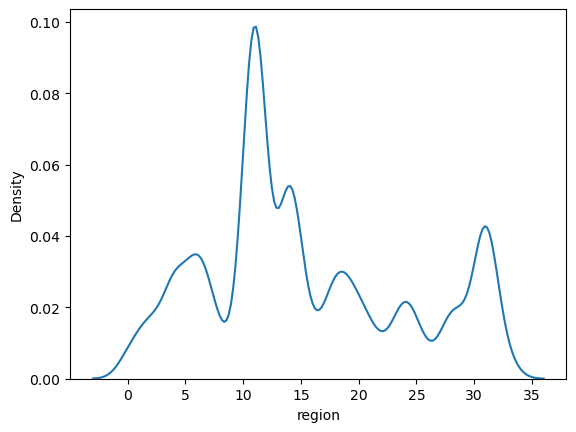

In [27]:
sns.kdeplot(Data['region'])

<AxesSubplot: xlabel='education', ylabel='Density'>

<AxesSubplot: xlabel='education', ylabel='Density'>

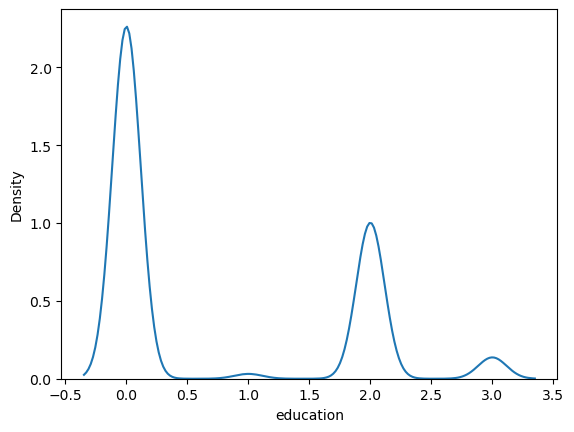

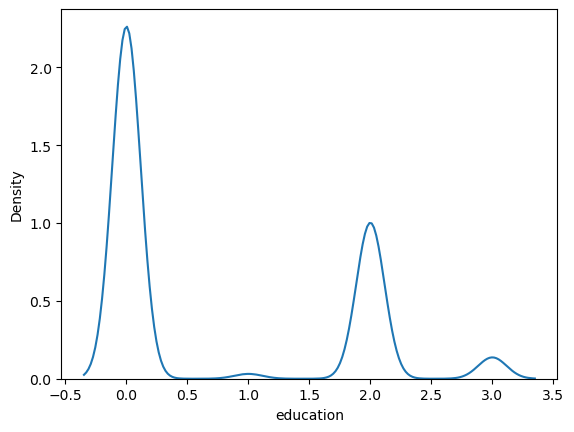

In [28]:
sns.kdeplot(Data['education'])

<AxesSubplot: xlabel='gender', ylabel='Density'>

<AxesSubplot: xlabel='gender', ylabel='Density'>

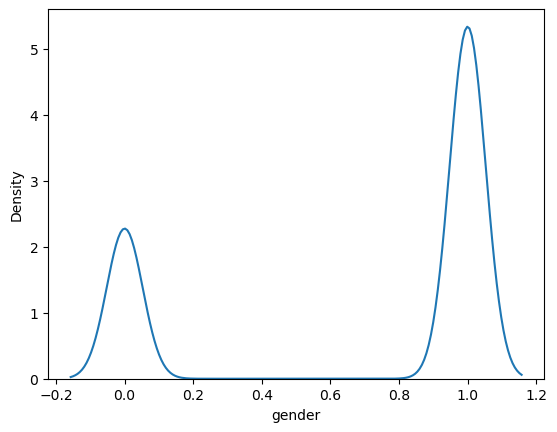

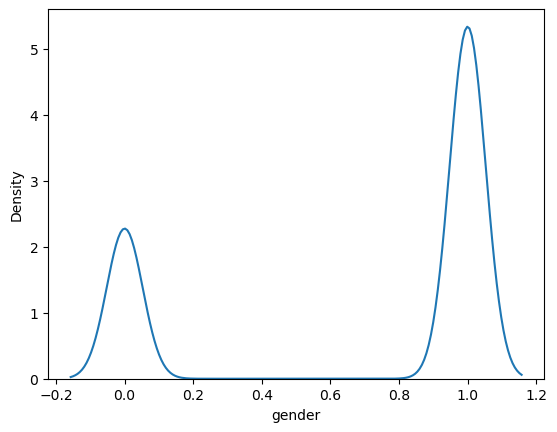

In [29]:
sns.kdeplot(Data['gender'])

<AxesSubplot: xlabel='recruitment_channel', ylabel='Density'>

<AxesSubplot: xlabel='recruitment_channel', ylabel='Density'>

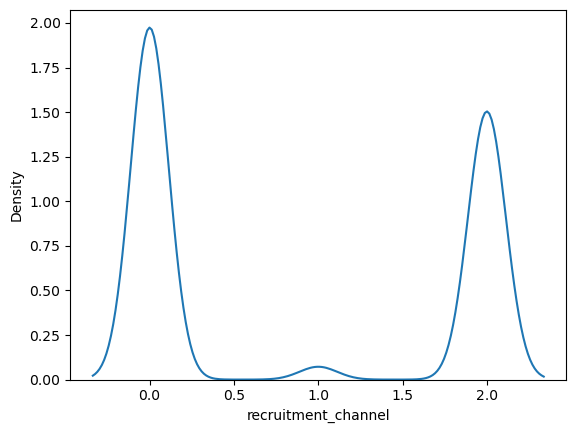

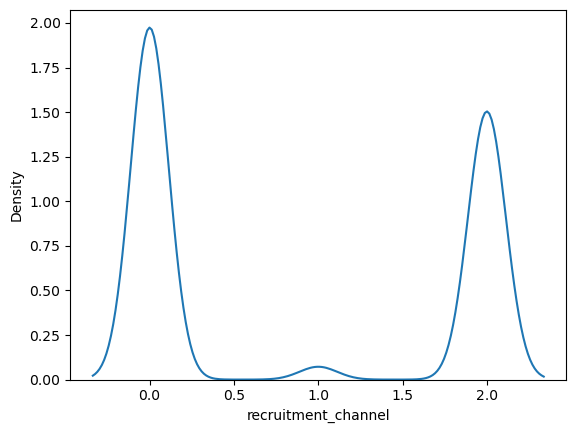

In [30]:
sns.kdeplot(Data['recruitment_channel'])

<AxesSubplot: xlabel='no_of_trainings', ylabel='Density'>

<AxesSubplot: xlabel='no_of_trainings', ylabel='Density'>

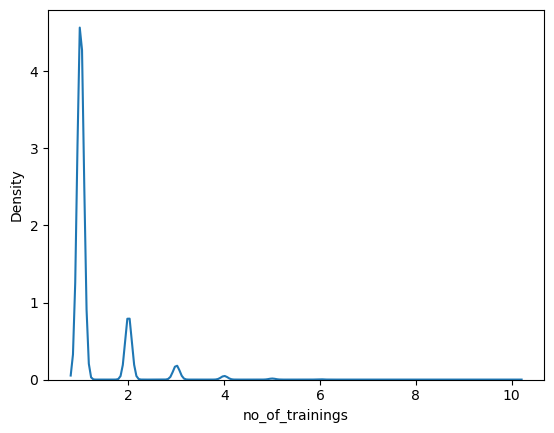

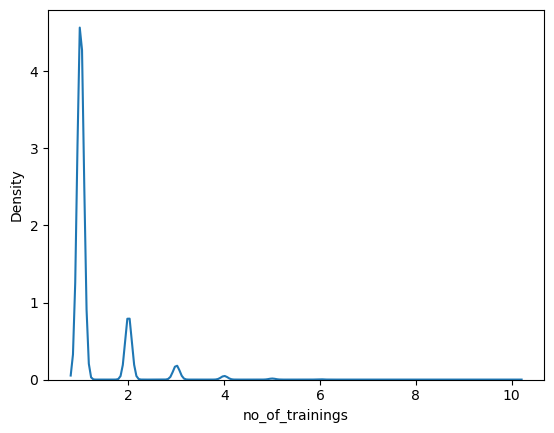

In [31]:
sns.kdeplot(Data[ 'no_of_trainings'])

<AxesSubplot: xlabel='age', ylabel='Density'>

<AxesSubplot: xlabel='age', ylabel='Density'>

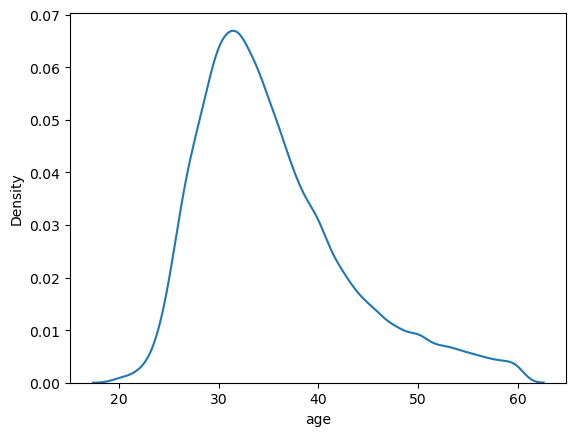

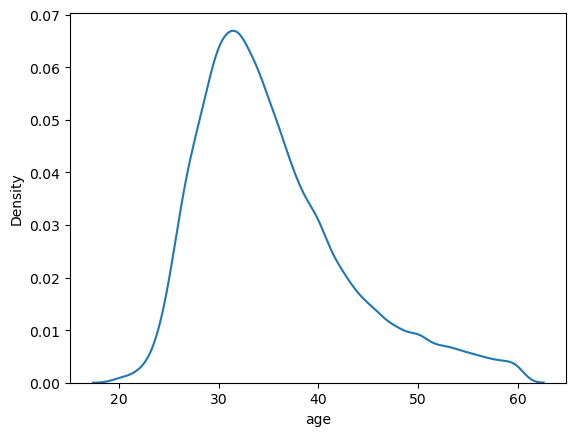

In [32]:
sns.kdeplot(Data['age'])

<AxesSubplot: xlabel='avg_training_score', ylabel='Density'>

<AxesSubplot: xlabel='avg_training_score', ylabel='Density'>

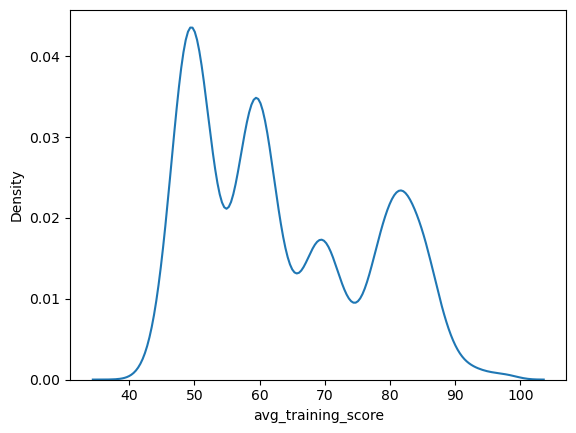

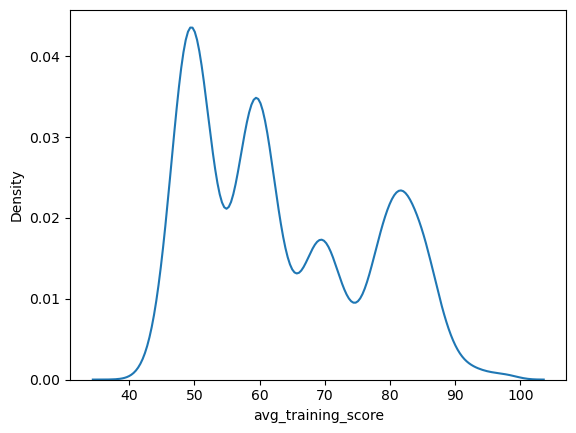

In [33]:
sns.kdeplot(Data['avg_training_score'])

<AxesSubplot: xlabel='is_promoted', ylabel='Density'>

<AxesSubplot: xlabel='is_promoted', ylabel='Density'>

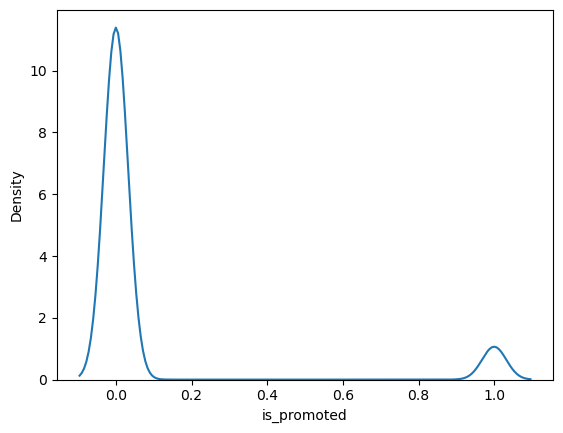

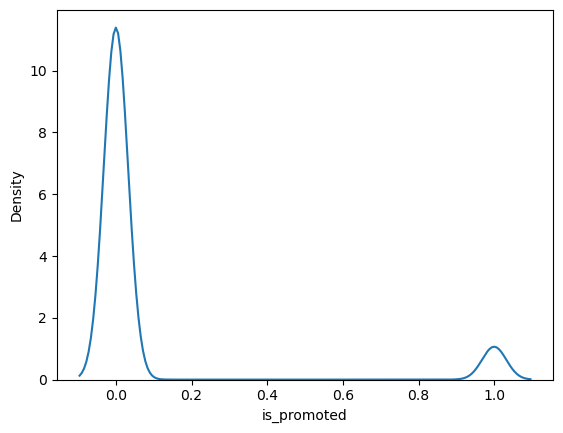

In [34]:
sns.kdeplot(Data['is_promoted'])

<AxesSubplot: >

<AxesSubplot: >

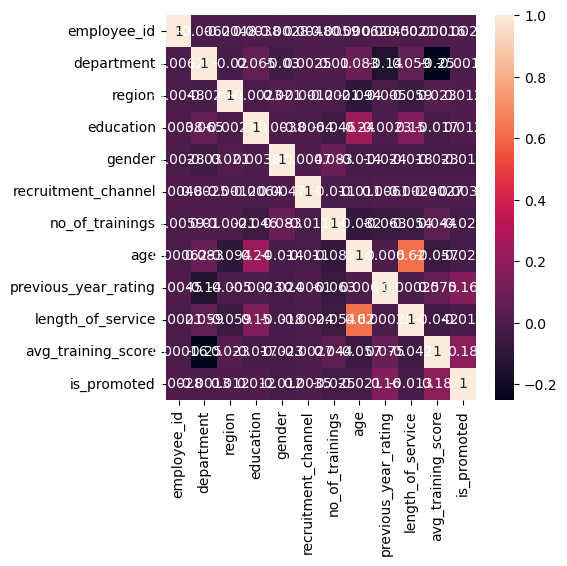

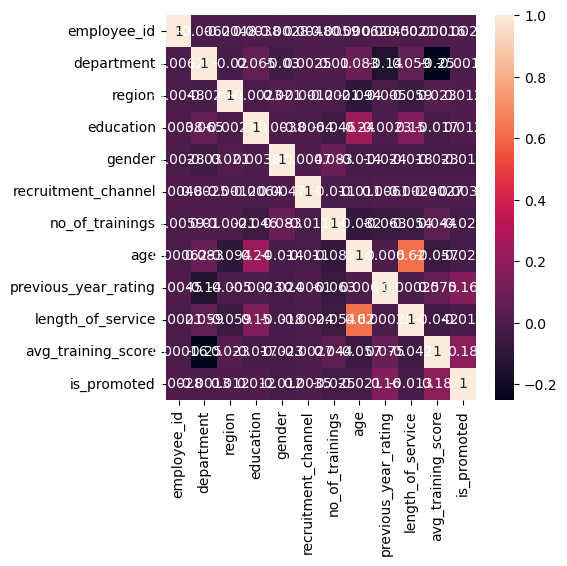

In [35]:
import seaborn as sns
corr = Data.corr()
plt.subplots(figsize=(5,5))
sns.heatmap(corr, annot = True)

In [36]:
from pandas_profiling import ProfileReport
profile = ProfileReport(Data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Model Implementation

In [37]:
X = Data.drop('is_promoted',axis=1)
X

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,avg_training_score
0,65438,7,31,2,0,2,1,35,5.0,8,49
1,65141,4,14,0,1,0,1,30,5.0,4,60
2,7513,7,10,0,1,2,1,34,3.0,7,50
3,2542,7,15,0,1,0,2,39,1.0,10,50
4,48945,8,18,0,1,0,1,45,3.0,2,73
...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,8,5,0,1,2,1,48,3.0,17,78
54804,74592,4,19,2,0,0,1,37,2.0,6,56
54805,13918,0,0,0,1,0,1,27,5.0,3,79
54806,13614,7,33,3,1,2,1,29,1.0,2,45


,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,avg_training_score
0,65438,7,31,2,0,2,1,35,5.0,8,49
1,65141,4,14,0,1,0,1,30,5.0,4,60
2,7513,7,10,0,1,2,1,34,3.0,7,50
3,2542,7,15,0,1,0,2,39,1.0,10,50
4,48945,8,18,0,1,0,1,45,3.0,2,73
...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,8,5,0,1,2,1,48,3.0,17,78
54804,74592,4,19,2,0,0,1,37,2.0,6,56
54805,13918,0,0,0,1,0,1,27,5.0,3,79
54806,13614,7,33,3,1,2,1,29,1.0,2,45


In [38]:
Y = Data['is_promoted']
Y 

0        0
1        0
2        0
3        0
4        0
        ..
54803    0
54804    0
54805    0
54806    0
54807    0
Name: is_promoted, Length: 50684, dtype: int64

0        0
1        0
2        0
3        0
4        0
        ..
54803    0
54804    0
54805    0
54806    0
54807    0
Name: is_promoted, Length: 50684, dtype: int64

In [39]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test =  train_test_split(X,Y,random_state=42,test_size=0.3)

In [40]:
# x_train1 = x_train1.dropna()

In [41]:
X_train.shape

(35478, 11)

(35478, 11)

In [42]:
# x_test1 = x_test1.dropna()

In [43]:
X_test.shape

(15206, 11)

(15206, 11)

In [44]:
# y_train1 = y_train1.dropna()

In [45]:
y_train.shape

(35478,)

(35478,)

In [46]:
# y_test1 = y_test1.dropna()

In [47]:
y_test.shape

(15206,)

(15206,)

# Decision Tree Algorithm

In [48]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
DT_Algorithm = DecisionTreeClassifier()
DT_Algorithm.fit(X_train, y_train)
DT_Algorithm_Prediction = DT_Algorithm.predict(X_test)
Accuracy_DT = accuracy_score(y_test, DT_Algorithm_Prediction)
print('Accuracy of Decision Tree Algorithm', Accuracy_DT)

Accuracy of Decision Tree Algorithm 0.8857030119689596
Accuracy of Decision Tree Algorithm 0.8857030119689596


In [49]:
from sklearn.naive_bayes import MultinomialNB 
from sklearn import metrics
NB_Algorithm = MultinomialNB()
NB_Algorithm.fit(X_train, y_train)
NB_Algorithm_Prediction = NB_Algorithm.predict(X_test)
Accuracy_NB = metrics.accuracy_score(y_test, NB_Algorithm_Prediction)
print('Accuracy of Naive Bayes Algorithm', Accuracy_NB)

Accuracy of Naive Bayes Algorithm 0.6640799684335131
Accuracy of Naive Bayes Algorithm 0.6640799684335131


Text(0.5, 1.0, 'Comparison Graph of all the Algorithm')

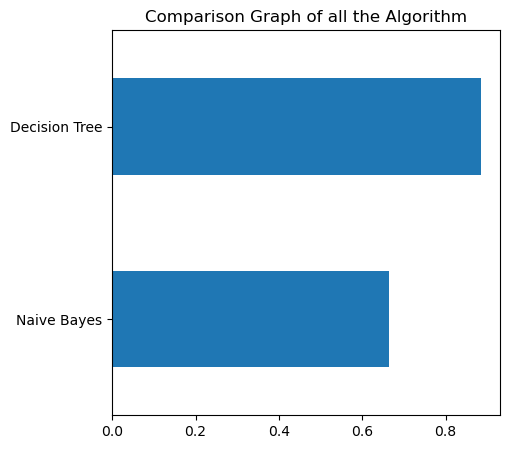

Text(0.5, 1.0, 'Comparison Graph of all the Algorithm')

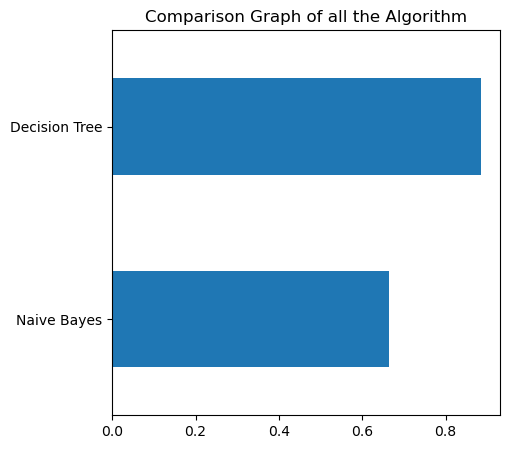

In [50]:
model_accuracy = pd.Series(data=[Accuracy_NB,Accuracy_DT], 
                index=['Naive Bayes','Decision Tree'])
fig= plt.figure(figsize=(5,5))
model_accuracy.sort_values().plot.barh()
plt.title('Comparison Graph of all the Algorithm')

In [51]:
Final_Prediction_data = (65438,0,0,0,1,35,5,8,1,0,49)
Final_Prediction_data = np.array(Final_Prediction_data)
Final_Prediction_data = Final_Prediction_data.reshape(1,-1)
Final_prediction = DT_Algorithm.predict(Final_Prediction_data)

if Final_prediction == 0:
    print("The Employee not got a Promotion")
else:
    print("The Patient got a Promotion")

The Employee not got a Promotion
The Employee not got a Promotion


In [52]:
Final_Prediction_data = (58304,0,0,0,0,0,1,33,5,6,51)
Final_Prediction_data = np.array(Final_Prediction_data)
Final_Prediction_data = Final_Prediction_data.reshape(1,-1)
Final_prediction = DT_Algorithm.predict(Final_Prediction_data)

if Final_prediction == 0:
    print("The Employee not got a Promotion")
else:
    print("The Patient got a Promotion")

The Employee not got a Promotion
The Employee not got a Promotion


# Generate Pickle File

In [53]:
import pickle
with open('model.pkl', 'wb') as file:
    pickle.dump(DT_Algorithm, file)

In [54]:
# Load the model from the .pkl file
with open('model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)

In [55]:
import pickle
with open('scalar.pkl', 'wb') as file1:
    pickle.dump(NB_Algorithm, file1)

In [56]:
# Load the model from the .pkl file
with open('scalar.pkl', 'rb') as file1:
    loaded_model = pickle.load(file1)